# IMDB Movies数据集分析

本次要分析的数据集是从1905年至2023年IMDb上评分最高的10000部电影的相关信息。

[数据集链接](https://www.kaggle.com/datasets/willianoliveiragibin/10000-data-about-movies-1915-2023)

数据集每列信息：
1. Movie Name：电影名称
2. Year of Release：发行年份
3. Run Time in Minutes：电影时长（分钟）
4. Movie Rating：评分
5. Votes：打分人数
6. MetaScore：主流媒体评分
7. Gross：票房总收入
8. Genre：风格/类型
9. Certification：分级
10. Director：导演（一人或多人）
11. Stars：主演
12. Description：描述

## 数据导入和预处理
使用[pandas](https://pandas.pydata.org/docs/user_guide/index.html)导入并简单查看数据。

In [1]:
import pandas as pd

In [2]:
movies = pd.read_csv("../data/data.csv", index_col=0)
movies.head(10)

,Movie Name,Year of Release,Run Time in minutes,Movie Rating,Votes,MetaScore,Gross,Genre,Certification,Director,Stars,Description
0,The Shawshank Redemption,1994,142,9.3,2804443,82.0,28340000.0,['Drama'],R,['Frank Darabont'],"['Tim Robbins', 'Morgan Freeman', 'Bob Gunton'...","['Over', 'the', 'course', 'of', 'several', 'ye..."
1,The Godfather,1972,175,9.2,1954174,100.0,134970000.0,"['Crime', ' Drama']",R,['Francis Ford Coppola'],"['Marlon Brando', 'Al Pacino', 'James Caan', '...","['Don', 'Vito', 'Corleone,', 'head', 'of', 'a'..."
2,Ramayana: The Legend of Prince Rama,1993,135,9.2,12995,NaN,NaN,"['Animation', ' Action', ' Adventure']",PG,"['Ram Mohan', 'Yûgô Sakô', 'Koichi Saski']","['Arun Govil', 'Nikhil Kapoor', 'Edie Mirman',...","['An', 'anime', 'adaptation', 'of', 'the', 'Hi..."
3,The Chaos Class,1975,87,9.2,42231,NaN,NaN,"['Comedy', ' Drama']",NaN,['Ertem Egilmez'],"['Kemal Sunal', 'Münir Özkul', 'Halit Akçatepe...","['Lazy,', 'uneducated', 'students', 'share', '..."
4,The Dark Knight,2008,152,9.0,2786129,84.0,534860000.0,"['Action', ' Crime', ' Drama']",PG-13,['Christopher Nolan'],"['Christian Bale', 'Heath Ledger', 'Aaron Eckh...","['When', 'the', 'menace', 'known', 'as', 'the'..."
5,Schindler's List,1993,195,9.0,1409869,95.0,96900000.0,"['Biography', ' Drama', ' History']",R,['Steven Spielberg'],"['Liam Neeson', 'Ralph Fiennes', 'Ben Kingsley...","['In', 'German-occupied', 'Poland', 'during', ..."
6,The Lord of the Rings: The Return of the King,2003,201,9.0,1919908,94.0,377850000.0,"['Action', ' Adventure', ' Drama']",PG-13,['Peter Jackson'],"['Elijah Wood', 'Viggo Mortensen', 'Ian McKell...","['Gandalf', 'and', 'Aragorn', 'lead', 'the', '..."
7,12 Angry Men,1957,96,9.0,834248,97.0,4360000.0,"['Crime', ' Drama']",Approved,['Sidney Lumet'],"['Henry Fonda', 'Lee J. Cobb', 'Martin Balsam'...","['The', 'jury', 'in', 'a', 'New', 'York', 'Cit..."
8,The Godfather Part II,1974,202,9.0,1327069,90.0,57300000.0,"['Crime', ' Drama']",R,['Francis Ford Coppola'],"['Al Pacino', 'Robert De Niro', 'Robert Duvall...","['The', 'early', 'life', 'and', 'career', 'of'..."
9,Mirror Game,2016,147,9.0,29102,NaN,NaN,"['Crime', ' Mystery', ' Thriller']",NaN,['Amitabh Reza Chowdhury'],"['Chanchal Chowdhury', 'Masuma Rahman Nabila',...","['Ayna,', 'an', 'alleged', 'chef', 'but', 'a',..."


可以看到，原始数据集中的Genre、Director、Stars和Description几个列是以**字符串**的形式存储起来的，而且和Python中定义数组的写法一致，因此可以通过使用**eval**方法，将这些字符串转换为数组的形式。

In [3]:
movies["Stars"] = movies["Stars"].apply(lambda x: list(eval(x)))
movies["Genre"] = movies["Genre"].apply(lambda x: list(eval(x)))
movies["Director"] = movies["Director"].apply(lambda x: list(eval(x)))
movies["Description"] = movies["Description"].apply(lambda x: " ".join(list(eval(x))))

movies.head(10)

,Movie Name,Year of Release,Run Time in minutes,Movie Rating,Votes,MetaScore,Gross,Genre,Certification,Director,Stars,Description
0,The Shawshank Redemption,1994,142,9.3,2804443,82.0,28340000.0,[Drama],R,[Frank Darabont],"[Tim Robbins, Morgan Freeman, Bob Gunton, Will...","Over the course of several years, two convicts..."
1,The Godfather,1972,175,9.2,1954174,100.0,134970000.0,"[Crime, Drama]",R,[Francis Ford Coppola],"[Marlon Brando, Al Pacino, James Caan, Diane K...","Don Vito Corleone, head of a mafia family, dec..."
2,Ramayana: The Legend of Prince Rama,1993,135,9.2,12995,NaN,NaN,"[Animation, Action, Adventure]",PG,"[Ram Mohan, Yûgô Sakô, Koichi Saski]","[Arun Govil, Nikhil Kapoor, Edie Mirman, Rael ...",An anime adaptation of the Hindu epic the Rama...
3,The Chaos Class,1975,87,9.2,42231,NaN,NaN,"[Comedy, Drama]",NaN,[Ertem Egilmez],"[Kemal Sunal, Münir Özkul, Halit Akçatepe, Tar...","Lazy, uneducated students share a very close b..."
4,The Dark Knight,2008,152,9.0,2786129,84.0,534860000.0,"[Action, Crime, Drama]",PG-13,[Christopher Nolan],"[Christian Bale, Heath Ledger, Aaron Eckhart, ...",When the menace known as the Joker wreaks havo...
5,Schindler's List,1993,195,9.0,1409869,95.0,96900000.0,"[Biography, Drama, History]",R,[Steven Spielberg],"[Liam Neeson, Ralph Fiennes, Ben Kingsley, Car...","In German-occupied Poland during World War II,..."
6,The Lord of the Rings: The Return of the King,2003,201,9.0,1919908,94.0,377850000.0,"[Action, Adventure, Drama]",PG-13,[Peter Jackson],"[Elijah Wood, Viggo Mortensen, Ian McKellen, O...",Gandalf and Aragorn lead the World of Men agai...
7,12 Angry Men,1957,96,9.0,834248,97.0,4360000.0,"[Crime, Drama]",Approved,[Sidney Lumet],"[Henry Fonda, Lee J. Cobb, Martin Balsam, John...",The jury in a New York City murder trial is fr...
8,The Godfather Part II,1974,202,9.0,1327069,90.0,57300000.0,"[Crime, Drama]",R,[Francis Ford Coppola],"[Al Pacino, Robert De Niro, Robert Duvall, Dia...",The early life and career of Vito Corleone in ...
9,Mirror Game,2016,147,9.0,29102,NaN,NaN,"[Crime, Mystery, Thriller]",NaN,[Amitabh Reza Chowdhury],"[Chanchal Chowdhury, Masuma Rahman Nabila, Par...","Ayna, an alleged chef but a actor goes to jail..."


## 电影发行量和评分与年份之间的关系

需要分析的内容：
1. 发行电影数量和年份之间的关系
2. 每年电影平均评分和年份之间的关系

我们使用[plotly](https://plotly.com/python/)进行图像绘制。

In [4]:
import plotly.express as px
import plotly.io as pio

# 设置plotly的主题，确保在PyCharm为暗色时图像颜色不会发生变化
pio.templates.default = "plotly"

In [5]:
movies_by_year = (
    movies.groupby("Year of Release")[["Movie Name", "Movie Rating"]]
    .agg({"Movie Name": "count", "Movie Rating": "mean"}).reset_index())

fig = px.line(movies_by_year, x="Year of Release", y="Movie Name",
              labels={"Year of Release": "年份", "Movie Name": "电影数量"},
              title="每年上映的电影数量")
fig.show()

fig = px.line(movies_by_year, x="Year of Release", y="Movie Rating",
              labels={"Year of Release": "年份", "Movie Rating": "电影评分"},
              title="每年电影的平均评分")
fig.show()

**结论：** 1915年到1980年间的电影具发行数量少而且增长缓慢。在1980年后发行的电影数量逐年上升。从2011年开始，每年发行电影数量突破300部且增长速度放缓。2019年-2022年，可能由于新冠疫情的影响，发行的电影数量呈下降趋势。

**结论：** 从1915年到2023年的电影评分有逐渐下降的趋势，虽然每年发行的电影数量增多，但是整体评分较低，拉低了高分电影的分数。

**注：** 数据集发行时间在2023年10月份，因此可能还有部分电影尚未发行，因此不予讨论。

# 电影类别的分析

需要分析的内容：
1. 电影评分和电影类别的关系
2. 电影时长和电影类别的关系
3. 不同种类电影的发行数量

In [6]:
movies_by_genre = movies.explode("Genre")
movies_by_genre["Genre"].unique()

array(['Drama', 'Crime', ' Drama', 'Animation', ' Action', ' Adventure',
       'Comedy', 'Action', ' Crime', 'Biography', ' History', ' Mystery',
       ' Thriller', 'Adventure', ' Fantasy', ' Biography', ' Sci-Fi',
       ' Romance', ' Western', ' Comedy', ' Horror', ' Family', ' Music',
       ' War', 'Horror', 'Mystery', 'Western', ' Sport', ' Film-Noir',
       ' Musical', 'Film-Noir', 'Fantasy', 'Family', 'Thriller',
       'Romance', 'Sci-Fi', 'Musical', 'Music', 'History'], dtype=object)

**注意：** 可以看到，数据之中存在重复值，比如"Drama"和" Drama"；"Crime"和" Crime"，他们之间只有空格的区别，因此可以算作一类，下面对数据进行去重。

In [7]:
movies_by_genre["Genre"] = movies_by_genre["Genre"].apply(lambda x: x.strip())
movies_by_genre["Genre"].unique()

array(['Drama', 'Crime', 'Animation', 'Action', 'Adventure', 'Comedy',
       'Biography', 'History', 'Mystery', 'Thriller', 'Fantasy', 'Sci-Fi',
       'Romance', 'Western', 'Horror', 'Family', 'Music', 'War', 'Sport',
       'Film-Noir', 'Musical'], dtype=object)

In [8]:
fig = px.box(movies_by_genre, x="Genre", y="Movie Rating",
             labels={"Genre": "电影类别", "Movie Rating": "电影评分"},
             title="电影评分随类别的分布箱线图")
fig.show()

**结论：** 电影评分中位数前5名的类别分别是：Film-Noir(7.7)、War(7.3)、Western(7.2)、History(7.2)和Musical(7.2)。

In [9]:
fig = px.box(movies_by_genre, x="Genre", y="Run Time in minutes",
             labels={"Genre": "电影类别", "Run Time in minutes": "电影时长（分钟）"},
             title="电影类别和时长的分布关系")
fig.show()

**结论：** 电影时长中位数的前五名分别是：History(125)、Musical(122)、Biography(120)、War(117)和Western(114.5)。

**结论：** 结合前面电影评分和类别的分布，可以得出History、Musical、War和Western四个类别，无论是在电影时长还是电影评分方面都具有较好的成绩。

In [10]:
movie_count_by_genre = (movies_by_genre
                        .groupby("Genre").agg("count").reset_index()
                        .sort_values("Movie Name", ascending=False))

fig = px.pie(movie_count_by_genre, values="Movie Name", names="Genre",
             labels={"Genre": "电影类别", "Movie Name": "电影数量"},
             title="电影数量和电影类别的分布图")
fig.show()

**结论：** 类别为Drama、Comedy、Action和Crime四个类别的电影发行数量处于领先低位，其余电影的数量占比较低。

## 参演明星的分析

需要分析的内容：
1. 明星参演电影数量的前20名
2. 明星参演电影平均时长前20名
3. 明星参演电影平均评分的前20名

In [11]:
# 使用dataframe.explode方法将列表展开
movies_by_star = (movies.explode("Stars")
                  .groupby("Stars")
                  .agg({"Movie Name": "count", "Movie Rating": "mean", "Run Time in minutes": "mean"})
                  .reset_index())

# 首先查看明星参演电影数量的分布图
fig = px.histogram(movies_by_star, x="Movie Name", marginal="violin",
                   labels={"Movie Name": "电影数量"},
                   title="明星参演电影数量的分布")
fig.show()

**注意：** 大多数明星参演电影数量实际上少于5部，其各项评价指标具有偶然性，因此需要去除。

In [12]:
movies_by_star = movies_by_star.drop(movies_by_star[movies_by_star["Movie Name"] <= 5].index)

fig = px.histogram(movies_by_star, x="Movie Name", marginal="violin",
                   labels={"Movie Name": "电影数量"},
                   title="明星参演电影数量的分布")
fig.show()

In [13]:
movie_count_by_star = (movies_by_star
                       .sort_values("Movie Name", ascending=False)
                       .head(20)
                       .sort_values("Movie Name", ascending=True))

fig = px.bar(movie_count_by_star, x="Movie Name", y="Stars", orientation="h",
             labels={"Stars": "明星", "Movie Name": "电影数量"},
             title="明星参演电影数量的前20名")
fig.show()

**结论：** 参演电影数量多于50部的明星有：Robert De Niro、Nicolas Cage、Samuel L. Jackson、Bruce Wills、Tom Hanks和Morgan Freeman。

In [14]:
movie_rating_by_star = (movies_by_star
                        .sort_values("Movie Rating", ascending=False)
                        .head(20)
                        .sort_values("Movie Rating", ascending=True))

fig = px.bar(movie_rating_by_star, x="Movie Rating", y="Stars", orientation="h",
             labels={"Movie Rating": "电影平均评分", "Stars": "明星"},
             title="明星电影平均评分前20名")
fig.show()

In [15]:
_top_rating_stars = list(movie_rating_by_star["Stars"])
_movies_stars_exploded = movies.explode("Stars")
_top_rating_stars_movies = _movies_stars_exploded[_movies_stars_exploded["Stars"].isin(_top_rating_stars)]

fig = px.box(_top_rating_stars_movies, x="Stars", y="Movie Rating",
             labels={"Stars": "明星", "Movie Rating": "电影评分"},
             title="平均分前20名影星的电影评分分布")
fig.show()

**结论：** 影星Kemal Sunal和Adile Nasit的电影整体评分较高且评分分布较为集中。

In [16]:
movie_time_by_star = (movies_by_star
                      .sort_values("Run Time in minutes", ascending=False)
                      .head(20)
                      .sort_values("Run Time in minutes", ascending=True))

fig = px.bar(movie_time_by_star, x="Run Time in minutes", y="Stars", orientation="h",
             labels={"Stars": "明星", "Run Time in minutes": "电影平均时长"},
             title="明星参演电影平均时长前20名")
fig.show()

**结论：** 参演电影平均时长最长的影星有Pieity G Zinta等20位。

## 电影各项指标的分布

需要分析的内容：
1. 电影评分和主流媒体评分的分布
2. 电影票房的分布
3. 电影时长的分布
4. 不同分级电影的分布图

In [17]:
pd.value_counts(movies["MetaScore"].isna())

MetaScore
False    7974
True     2026
Name: count, dtype: int64

**注意：** 主流媒体的评分存在缺失值，因此需要进行去除。

In [18]:
movies_with_scores = movies.drop(movies[movies["MetaScore"].isna()].index)
movies_with_scores["MetaScore"].head(10)

0      82.0
1     100.0
4      84.0
5      95.0
6      94.0
7      97.0
8      90.0
11     95.0
16     67.0
17     92.0
Name: MetaScore, dtype: float64

**注意：** MetaScore中的评分都是百分制，因此需要转换为十分制。

In [19]:
movies_with_scores["MetaScore"] = movies_with_scores["MetaScore"].apply(lambda x: x / 10)
movies_with_scores.head(10)

,Movie Name,Year of Release,Run Time in minutes,Movie Rating,Votes,MetaScore,Gross,Genre,Certification,Director,Stars,Description
0,The Shawshank Redemption,1994,142,9.3,2804443,8.2,28340000.0,[Drama],R,[Frank Darabont],"[Tim Robbins, Morgan Freeman, Bob Gunton, Will...","Over the course of several years, two convicts..."
1,The Godfather,1972,175,9.2,1954174,10.0,134970000.0,"[Crime, Drama]",R,[Francis Ford Coppola],"[Marlon Brando, Al Pacino, James Caan, Diane K...","Don Vito Corleone, head of a mafia family, dec..."
4,The Dark Knight,2008,152,9.0,2786129,8.4,534860000.0,"[Action, Crime, Drama]",PG-13,[Christopher Nolan],"[Christian Bale, Heath Ledger, Aaron Eckhart, ...",When the menace known as the Joker wreaks havo...
5,Schindler's List,1993,195,9.0,1409869,9.5,96900000.0,"[Biography, Drama, History]",R,[Steven Spielberg],"[Liam Neeson, Ralph Fiennes, Ben Kingsley, Car...","In German-occupied Poland during World War II,..."
6,The Lord of the Rings: The Return of the King,2003,201,9.0,1919908,9.4,377850000.0,"[Action, Adventure, Drama]",PG-13,[Peter Jackson],"[Elijah Wood, Viggo Mortensen, Ian McKellen, O...",Gandalf and Aragorn lead the World of Men agai...
7,12 Angry Men,1957,96,9.0,834248,9.7,4360000.0,"[Crime, Drama]",Approved,[Sidney Lumet],"[Henry Fonda, Lee J. Cobb, Martin Balsam, John...",The jury in a New York City murder trial is fr...
8,The Godfather Part II,1974,202,9.0,1327069,9.0,57300000.0,"[Crime, Drama]",R,[Francis Ford Coppola],"[Al Pacino, Robert De Niro, Robert Duvall, Dia...",The early life and career of Vito Corleone in ...
11,Pulp Fiction,1994,154,8.9,2150981,9.5,107930000.0,"[Crime, Drama]",R,[Quentin Tarantino],"[John Travolta, Uma Thurman, Samuel L. Jackson...","The lives of two mob hitmen, a boxer, a gangst..."
16,Fight Club,1999,139,8.8,2238708,6.7,37030000.0,[Drama],R,[David Fincher],"[Brad Pitt, Edward Norton, Meat Loaf, Zach Gre...",An insomniac office worker and a devil-may-car...
17,The Lord of the Rings: The Fellowship of the Ring,2001,178,8.8,1948130,9.2,315540000.0,"[Action, Adventure, Drama]",PG-13,[Peter Jackson],"[Elijah Wood, Ian McKellen, Orlando Bloom, Sea...",A meek Hobbit from the Shire and eight compani...


In [20]:
from plotly.figure_factory import create_distplot

movies_with_scores = movies_with_scores[["Movie Rating", "MetaScore"]]
fig = create_distplot([movies_with_scores["Movie Rating"], movies_with_scores["MetaScore"]],
                      group_labels=["IMDb网站评分", "主流媒体评分"],
                      show_rug=False, bin_size=0.1)

fig.update_layout(title="主流媒体评分和IMDb网站评分的分布")
fig.show()

**结论：** 本数据集是IMDb上评分前10000的电影，因此会出现评分分布都在平均值以上的情况，而主流媒体对这些电影的评价褒贬不一，因此其分布会更加均匀。

**注：** 本次数据分析的重点在网站评分，因此后续会忽略掉主流媒体的评分分布。

In [21]:
pd.value_counts(movies["Gross"].isna())

Gross
False    7085
True     2915
Name: count, dtype: int64

In [22]:
movies_with_gross = movies.drop(movies[movies["Gross"].isna()].index)

fig = px.box(movies_with_gross, x="Gross", labels={"Gross": "电影票房"}, title="电影票房的分布")
fig.show()

**结论：** 大部分电影的票房位于200万-4000万美元之间，少部分在1亿-4亿美元之间，最高可达到93亿美元。

In [23]:
fig = create_distplot([movies["Run Time in minutes"]], group_labels=["电影时长"], show_rug=False)
fig.update_layout(title="电影时长的分布")
fig.show()

**结论：** 大部分的电影时长分布在80分钟-150分钟。

In [24]:
pd.value_counts(movies["Certification"])

Certification
R            4048
PG-13        2149
Not Rated    1272
PG           1174
G             222
TV-MA         200
Approved      151
Passed        150
TV-14          83
Unrated        71
TV-PG          35
NC-17          28
GP             15
TV-G            8
16+             5
M/PG            4
18+             3
M               3
13+             3
TV-13           2
X               2
TV-Y7           1
MA-17           1
TV-Y7-FV        1
Name: count, dtype: int64

In [25]:
movies_by_certification = movies.groupby("Certification").agg("count").reset_index()
movies_by_certification = movies_by_certification[["Certification", "Movie Name"]]
# 不足1%的算做其他
movies_by_certification["Certification"].loc[movies_by_certification["Movie Name"] <= 100] = "其他"

fig = px.pie(movies_by_certification, values="Movie Name", names="Certification",
             labels={"Certification": "电影分级", "Movie Name": "数量"},
             title="各个分级的电影数量")

fig.show()

**结论：** 占比最多的电影分级为R、PG-13、Not Rated和PG四种。

**注：** 数量不足1%的电影分级统一算作其他。

## 导演相关数据的分析

需要分析的内容：
1. 导演执导电影数量的排名
2. 导演平均电影评分的排名
3. 导演和演员组合评分的排名

In [26]:
movies_by_director = (movies.explode("Director")
                      .groupby("Director").agg({"Movie Name": "count", "Movie Rating": "mean"}).reset_index())
movies_by_director

,Director,Movie Name,Movie Rating
0,A.L. Vijay,2,6.100
1,A.R. Murugadoss,8,7.225
2,ALi Khan AK,1,5.500
3,Aamir Khan,1,8.300
4,Aanand L. Rai,6,6.500
...,...,...,...
4346,Éric Warin,1,6.700
4347,Ömer Faruk Sorak,5,7.440
4348,Ömer Vargi,2,7.950
4349,Özer Feyzioglu,1,8.200


In [27]:
movie_count_by_director = (movies_by_director
                           .sort_values("Movie Name", ascending=False)
                           .head(20)
                           .sort_values("Movie Name", ascending=True))

fig = px.bar(movie_count_by_director, x="Movie Name", y="Director", orientation="h",
             labels={"Movie Name": "电影数量", "Director": "导演"},
             title="导演执导电影数量的前20名")
fig.show()

**结论：** 执导电影数量前3名的导演是：Clint Eastwood、Steven Spielberg、Steven Soderbergh。

In [28]:
movie_rating_by_director = (movies_by_director
                            .sort_values("Movie Rating", ascending=False)
                            .head(20)
                            .sort_values("Movie Rating", ascending=True))

fig = px.bar(movie_rating_by_director, x="Movie Rating", y="Director", orientation="h",
             labels={"Movie Rating": "电影评分", "Director": "导演"},
             title="导演执导电影评分的前20名")
fig.show()

In [29]:
_top_rating_directors = list(movie_rating_by_director["Director"])
_movies_director_exploded = movies.explode("Director")
_top_rating_director_movies = _movies_director_exploded[
    _movies_director_exploded["Director"].isin(_top_rating_directors)]

fig = px.box(_top_rating_director_movies, x="Director", y="Movie Rating",
             labels={"Director": "导演", "Movie Rating": "电影评分"},
             title="平均分前20名导演的电影评分分布")
fig.show()

**结论：** 评分较高的导演中，大部分导演都只有一部电影，执导多部电影的导演有：Ertem Egilmez、Karatal Tibet和Slobodan Sijan。

In [30]:
movies_exploded = movies.explode("Stars").explode("Director")
movies_grouped = (movies_exploded
                           .groupby(["Director", "Stars"])
                           .agg({"Movie Name": "count", "Movie Rating": "mean"})
                           .reset_index())

# 将导演和演员拼接在一起，并删除这两列
movies_grouped["Group"] = movies_grouped["Director"].str.cat(movies_grouped["Stars"], sep=" & ")
movies_grouped.drop(columns=["Director", "Stars"])
# 将dataframe重新排序
movies_grouped = movies_grouped[["Group", "Movie Name", "Movie Rating"]]
movies_grouped

,Group,Movie Name,Movie Rating
0,A.L. Vijay & Amala Paul,1,6.3
1,A.L. Vijay & Arvind Swami,1,5.9
2,A.L. Vijay & Joseph Vijay,1,6.3
3,A.L. Vijay & Kangana Ranaut,1,5.9
4,A.L. Vijay & Nassar,1,5.9
...,...,...,...
40463,Özer Feyzioglu & Yetkin Dikinciler,1,8.2
40464,Özer Kiziltan & Erkan Can,1,7.4
40465,Özer Kiziltan & Güven Kiraç,1,7.4
40466,Özer Kiziltan & Meray Ülgen,1,7.4


In [31]:
movie_count_by_group = (movies_grouped
                        .sort_values("Movie Name", ascending=False)
                        .head(20)
                        .sort_values("Movie Name", ascending=True))

fig = px.bar(movie_count_by_group, x="Movie Name", y="Group",
             labels={"Movie Name": "电影数量", "Group": "组合"},
             title="出品电影数量前20名的组合")
fig.show()

**结论：** 有些导演自导自演，其中出品电影数量的前三名是：Clint Eastwood、Woody Allen和Kenneth Branagh。除此之外，出品电影数量前三名的组合是：Akira Kurosawa & Toshirô Mifune、Woody Allen & Mia Farrow和John Ford & John Wayne。

In [32]:
movie_rating_by_group = (movies_grouped
                        .sort_values("Movie Rating", ascending=False)
                        .head(20)
                        .sort_values("Movie Rating", ascending=True))

fig = px.bar(movie_rating_by_group, x="Movie Rating", y="Group",
             labels={"Movie Rating": "电影评分", "Group": "组合"},
             title="出品电影评分前20名的组合")
fig.show()

**结论：** 出品电影评分较高的组合有Frank Darabont & Morgan Freeman等几个组合。

## 电影票房的分析

需要分析的内容：
1. 电影票房和时长的关系
2. 电影评分和时长的关系
3. 电影票房和打分人数的关系
4. 电影评分和打分人数的关系


In [33]:
fig = px.scatter(movies_with_gross, x="Run Time in minutes", y="Gross",
                 labels={"Run Time in minutes": "时长", "Gross": "票房"},
                 title="电影票房和时长的散点图")
fig.show()

In [34]:
fig = px.scatter(movies, x="Run Time in minutes", y="Movie Rating",
                 labels={"Run Time in minutes": "时长", "Movie Rating": "电影评分"},
                 title="电影评分和时长的散点图")
fig.show()

In [35]:
fig = px.scatter(movies_with_gross, x="Votes", y="Gross",
                 labels={"Votes": "打分人数", "Gross": "票房"},
                 title="电影打分人数和时长的散点图")
fig.show()

In [36]:
fig = px.scatter(movies, x="Votes", y="Movie Rating",
                 labels={"Votes": "打分人数", "Movie Rating": "电影评分"},
                 title="电影评分和打分人数的散点图")
fig.show()

# 电影名称和描述的可视化

需要分析的内容：
1. 使用WordCloud对电影名称和描述进行可视化


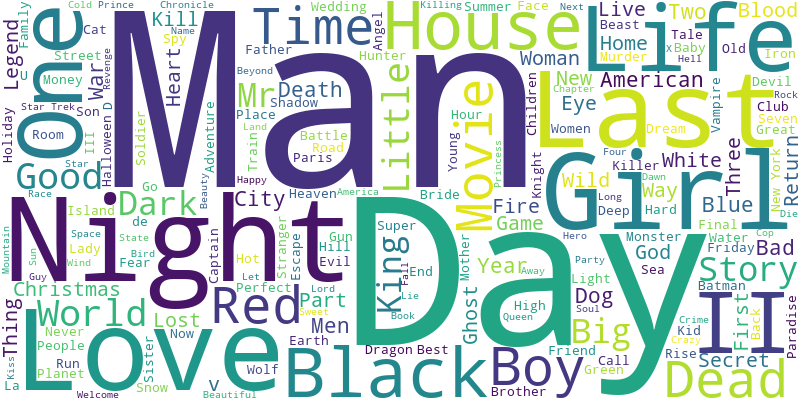

In [37]:
from wordcloud import WordCloud

movie_names = " ".join(movies["Movie Name"])
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(movie_names)

fig = px.imshow(wordcloud, title="电影名称的词云图")
fig.show()


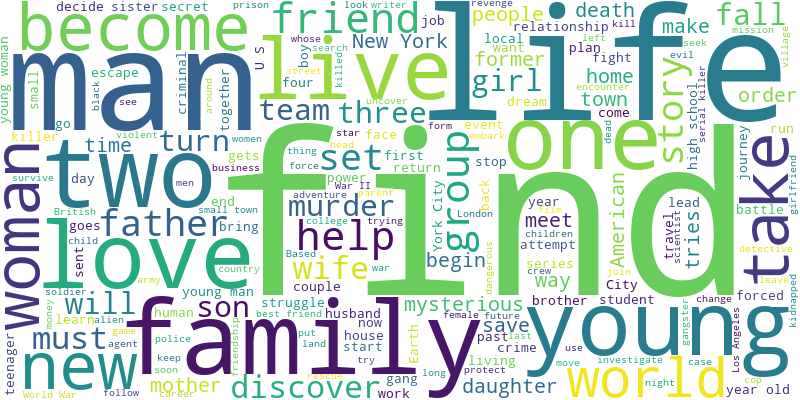

In [38]:
movie_descriptions = " ".join(movies["Description"])
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(movie_descriptions)

fig = px.imshow(wordcloud, title="电影评价的词云图")
fig.show()